In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

df= pd.read_csv('bank-additional-full.csv',sep=';')

df




,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41194,74.0,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41195,74.0,NaN,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41196,74.0,retired,married,NaN,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
#To see entire data 
print(df.to_string())

        age            job   marital            education  default  housing     loan    contact month day_of_week  duration  campaign  pdays  previous     poutcome  emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed    y
0      56.0      housemaid   married             basic.4y       no       no       no  telephone   may         mon     261.0       1.0  999.0       0.0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
1      57.0       services   married          high.school  unknown       no       no  telephone   may         mon     149.0       1.0  999.0       0.0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
2      37.0       services   married          high.school       no      yes       no  telephone   may         mon     226.0       1.0  999.0       0.0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
3      40.0         admin.   married            

In [7]:
df.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41199 entries, 0 to 41198
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41195 non-null  float64
 1   job             41194 non-null  object 
 2   marital         41194 non-null  object 
 3   education       41194 non-null  object 
 4   default         41195 non-null  object 
 5   housing         41196 non-null  object 
 6   loan            41195 non-null  object 
 7   contact         41195 non-null  object 
 8   month           41196 non-null  object 
 9   day_of_week     41196 non-null  object 
 10  duration        41196 non-null  float64
 11  campaign        41196 non-null  float64
 12  pdays           41196 non-null  float64
 13  previous        41196 non-null  float64
 14  poutcome        41194 non-null  object 
 15  emp.var.rate    41196 non-null  float64
 16  cons.price.idx  41195 non-null  float64
 17  cons.conf.idx   41196 non-null 

In [9]:
df.shape

(41199, 21)

In [13]:
df.isnull().sum()
df.isnull().sum().sum()
df.dropna(inplace=True)  # Dropped all the null values 



np.int64(0)

In [16]:
# Remove Duplicate
df.duplicated().sum()# 13 duplicates are there
df.drop_duplicates(inplace=True)


np.int64(0)

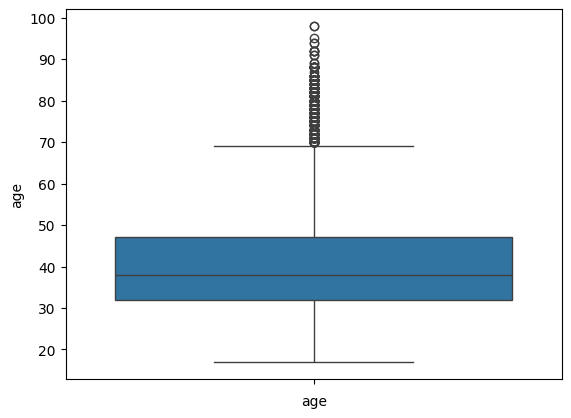

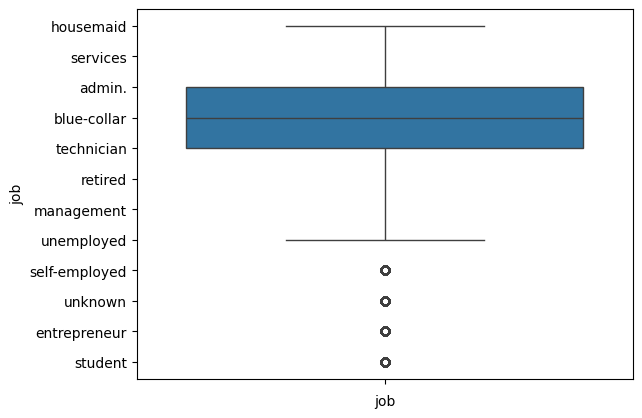

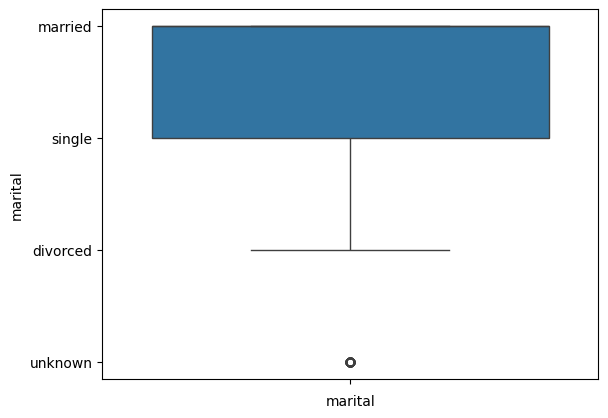

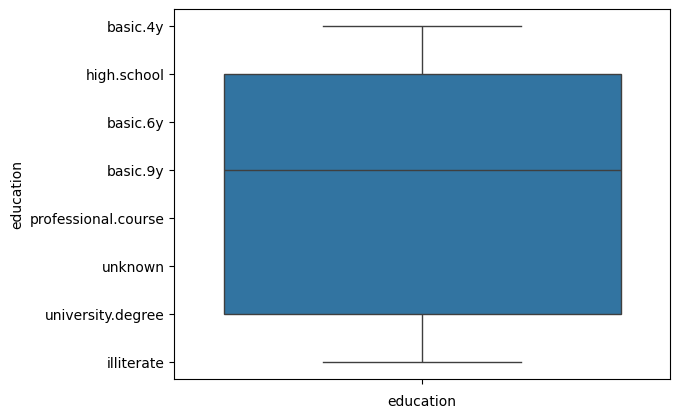

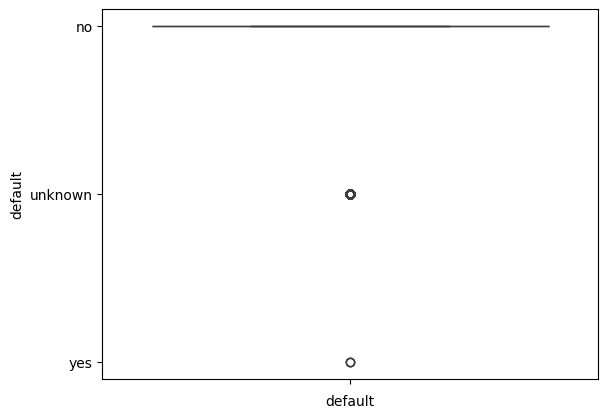

...

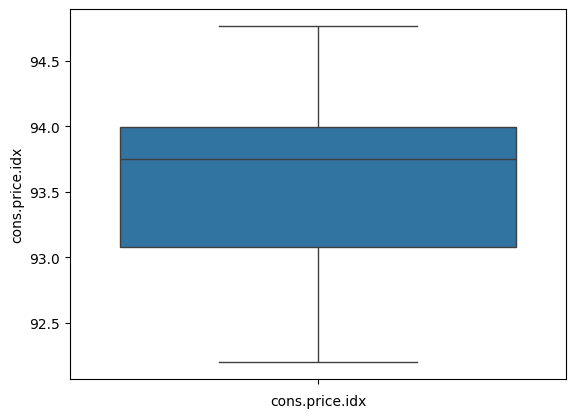

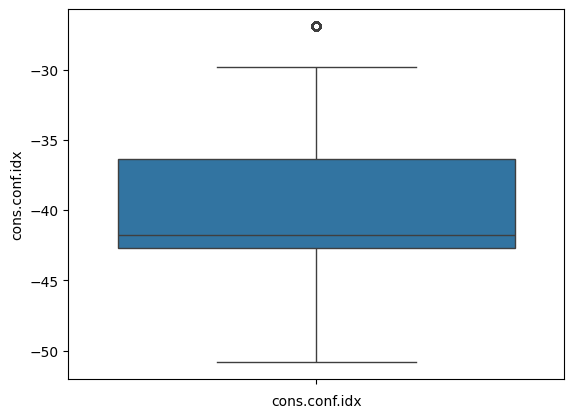

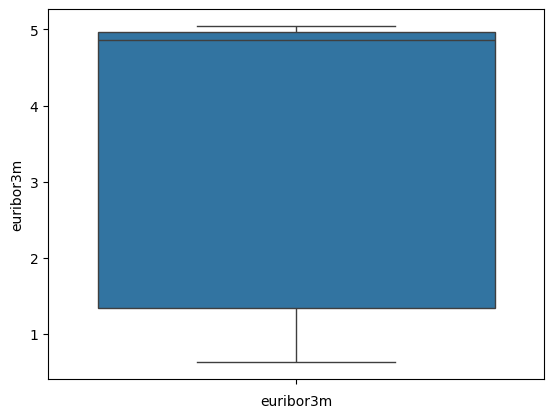

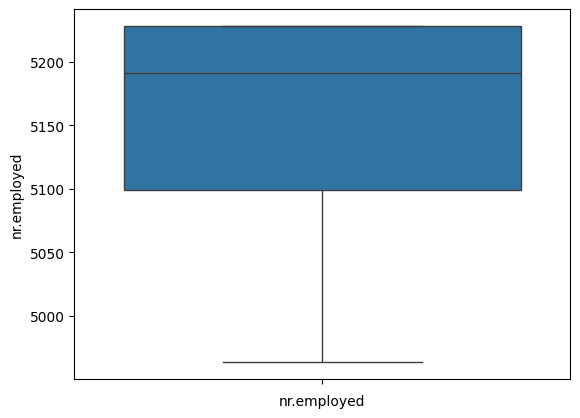

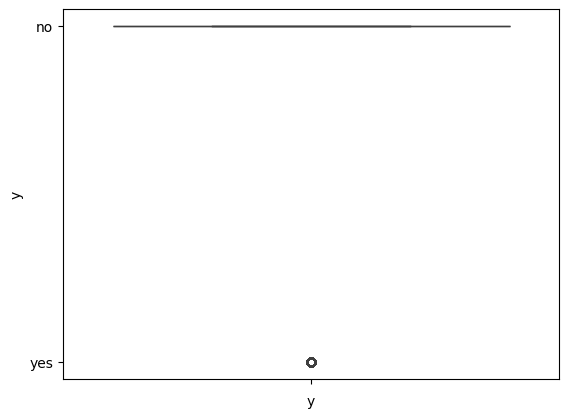

In [18]:
#Find  outliers

for i in df.columns:
    if (df[i].dtype!='objects'):
        sns.boxplot(df[i])
        plt.xlabel(i)
        plt.show()

        #Except duration rest all columns with outliers are extra information therefore no need to remove their outliers




In [19]:
# Remove Outliers

q1= df['duration'].quantile(0.25)
q3= df['duration'].quantile(0.75)
IQR= q3-q1
lb= q1-1.5*IQR
up = q3 + 1.5*IQR
df= df[(df['duration']>=lb)& (df['duration']<=up)]


#we have to run only once as it will keep remob=ving outliers as many times we run it

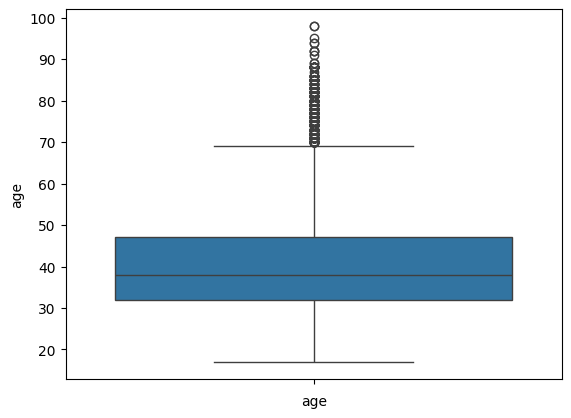

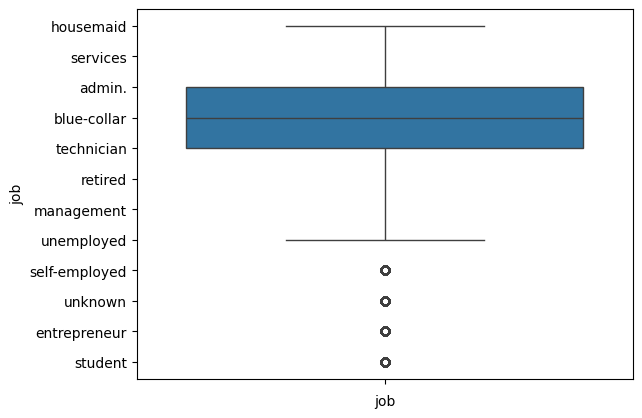

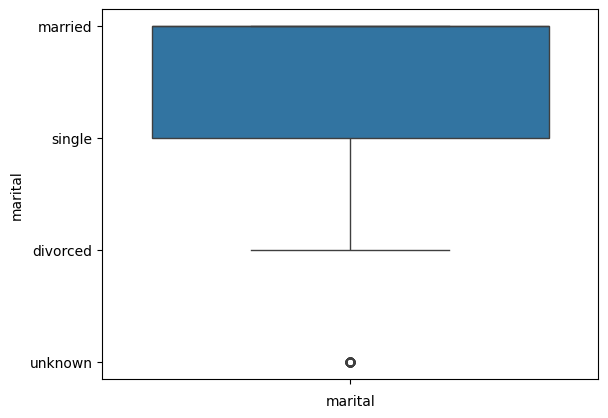

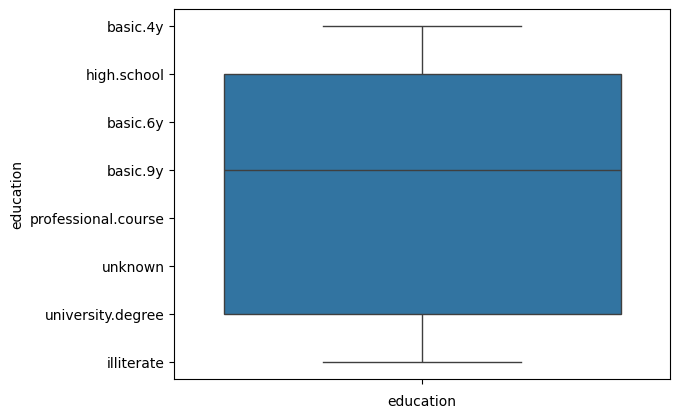

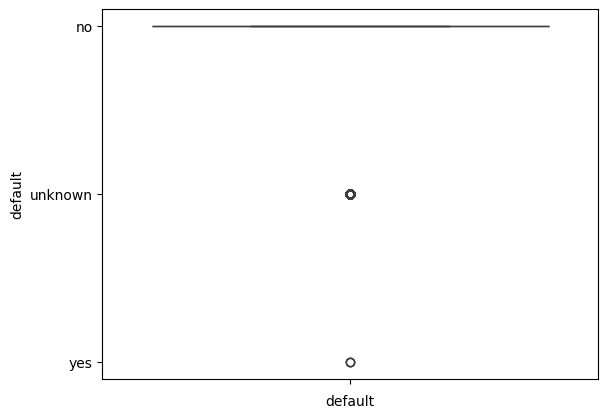

...

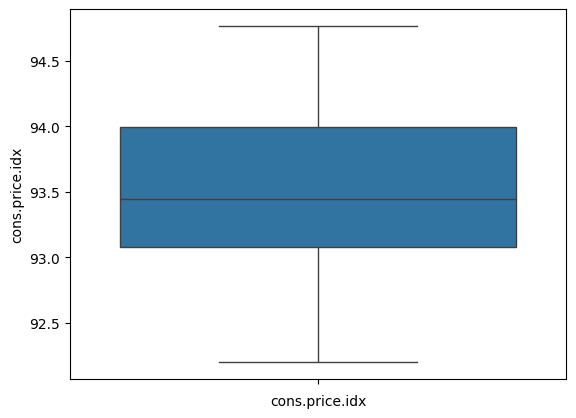

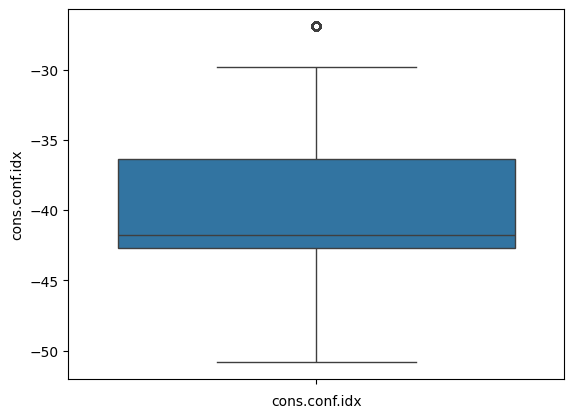

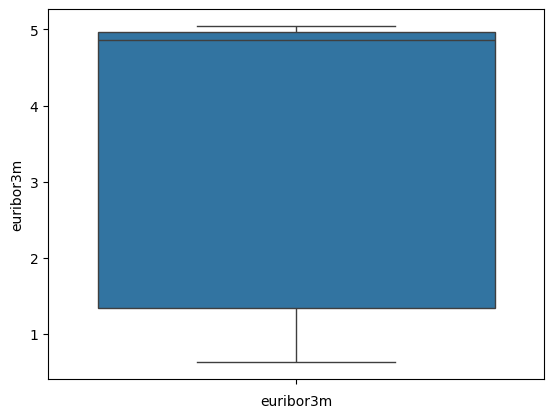

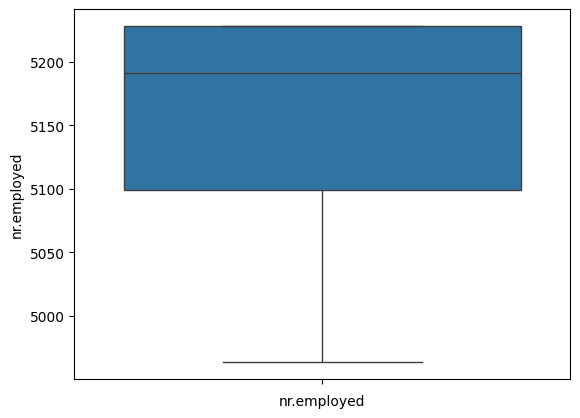

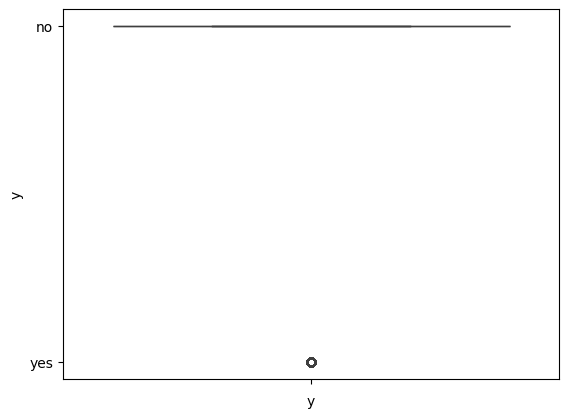

In [20]:
#check if outliers are removed

for i in df.columns:
    if (df[i].dtype!='objects'):
        sns.boxplot(df[i])
        plt.xlabel(i)
        plt.show()
        # here we can see the outliers for duration column is removed

In [25]:
#Label Encoding

from sklearn.preprocessing import LabelEncoder
le  = LabelEncoder()

for col in df.columns:
    if (df[col].dtype=='object'):
        df[col]= le.fit_transform(df[col])

#df.info()  # to check if object dtype is converted to int64





<class 'pandas.core.frame.DataFrame'>
Index: 38214 entries, 0 to 41193
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             38214 non-null  float64
 1   job             38214 non-null  int64  
 2   marital         38214 non-null  int64  
 3   education       38214 non-null  int64  
 4   default         38214 non-null  int64  
 5   housing         38214 non-null  int64  
 6   loan            38214 non-null  int64  
 7   contact         38214 non-null  int64  
 8   month           38214 non-null  int64  
 9   day_of_week     38214 non-null  int64  
 10  duration        38214 non-null  float64
 11  campaign        38214 non-null  float64
 12  pdays           38214 non-null  float64
 13  previous        38214 non-null  float64
 14  poutcome        38214 non-null  int64  
 15  emp.var.rate    38214 non-null  float64
 16  cons.price.idx  38214 non-null  float64
 17  cons.conf.idx   38214 non-null  floa

In [30]:
#VIF -Variance Inflation Factor - It is used to detect/ remove multicollinearity 

from statsmodels.stats.outliers_influence import variance_inflation_factor

col_list=[]
for i in df.columns:
    if ((df[i].dtype!='object')& (i!='y')):  # here we have to exclude the dependent columns so y is excluded
        col_list.append(i)

X= df[col_list]
vif_data= pd.DataFrame()
vif_data['Column_Name']= X.columns
vif_data['VIF_Score']=[
    variance_inflation_factor(X.values,i)
    for i in range (len(X.columns))
]


In [31]:
vif_data # provides VIF Score for columns and we can use it to remove it one by one starting from highest VIF score cause as we 
         # start removing them the VIF score of other columns also change 




,Column_Name,VIF_Score
0,age,19.731525
1,job,2.117973
2,marital,5.642679
3,education,4.468191
4,default,1.405534
5,housing,2.208061
6,loan,1.207746
7,contact,2.870595
8,month,6.828075
9,day_of_week,3.080979


In [33]:
df= df.drop(['nr.employed'],axis=1) # as nr.employed has highest VIF score we remove it first




In [35]:
#to check again we have to run this code 

from statsmodels.stats.outliers_influence import variance_inflation_factor

col_list=[]
for i in df.columns:
    if ((df[i].dtype!='object')& (i!='y')):  # here we have to exclude the dependent columns so y is excluded
        col_list.append(i)

X= df[col_list]
vif_data= pd.DataFrame()
vif_data['Column_Name']= X.columns
vif_data['VIF_Score']=[
    variance_inflation_factor(X.values,i)
    for i in range (len(X.columns))
]

vif_data # here we can see it is removed ne.employed now take the next highest that is cons.price.idx


,Column_Name,VIF_Score
0,age,19.682963
1,job,2.117623
2,marital,5.641464
3,education,4.467735
4,default,1.402596
5,housing,2.207750
6,loan,1.207703
7,contact,2.411614
8,month,5.823916
9,day_of_week,3.080384


In [36]:
df= df.drop(['cons.price.idx'],axis=1)  # we have to do this process until all the VIF score are <= 5


In [37]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

col_list=[]
for i in df.columns:
    if ((df[i].dtype!='object')& (i!='y')):  # here we have to exclude the dependent columns so y is excluded
        col_list.append(i)

X= df[col_list]
vif_data= pd.DataFrame()
vif_data['Column_Name']= X.columns
vif_data['VIF_Score']=[
    variance_inflation_factor(X.values,i)
    for i in range (len(X.columns))
]

vif_data

,Column_Name,VIF_Score
0,age,18.541753
1,job,2.111816
2,marital,5.497290
3,education,4.417641
4,default,1.402562
5,housing,2.206120
6,loan,1.207145
7,contact,2.330410
8,month,5.783245
9,day_of_week,3.068324


In [38]:
df= df.drop(['euribor3m'],axis=1)

In [39]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

col_list=[]
for i in df.columns:
    if ((df[i].dtype!='object')& (i!='y')):  # here we have to exclude the dependent columns so y is excluded
        col_list.append(i)

X= df[col_list]
vif_data= pd.DataFrame()
vif_data['Column_Name']= X.columns
vif_data['VIF_Score']=[
    variance_inflation_factor(X.values,i)
    for i in range (len(X.columns))
]

vif_data

,Column_Name,VIF_Score
0,age,17.928376
1,job,2.110855
2,marital,5.464819
3,education,4.375468
4,default,1.402413
5,housing,2.204671
6,loan,1.207081
7,contact,2.323954
8,month,5.301690
9,day_of_week,3.057989


In [40]:
df= df.drop(['cons.conf.idx'],axis=1)


In [41]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

col_list=[]
for i in df.columns:
    if ((df[i].dtype!='object')& (i!='y')):  # here we have to exclude the dependent columns so y is excluded
        col_list.append(i)

X= df[col_list]
vif_data= pd.DataFrame()
vif_data['Column_Name']= X.columns
vif_data['VIF_Score']=[
    variance_inflation_factor(X.values,i)
    for i in range (len(X.columns))
]

vif_data

,Column_Name,VIF_Score
0,age,17.927045
1,job,2.110326
2,marital,5.446543
3,education,4.365020
4,default,1.401290
5,housing,2.202082
6,loan,1.206410
7,contact,2.249138
8,month,5.271562
9,day_of_week,3.057978


In [42]:
df= df.drop(['pdays'],axis=1)


In [43]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

col_list=[]
for i in df.columns:
    if ((df[i].dtype!='object')& (i!='y')):  # here we have to exclude the dependent columns so y is excluded
        col_list.append(i)

X= df[col_list]
vif_data= pd.DataFrame()
vif_data['Column_Name']= X.columns
vif_data['VIF_Score']=[
    variance_inflation_factor(X.values,i)
    for i in range (len(X.columns))
]

vif_data

,Column_Name,VIF_Score
0,age,9.980310
1,job,2.094738
2,marital,4.282810
3,education,4.050878
4,default,1.399749
5,housing,2.153926
6,loan,1.202400
7,contact,2.246846
8,month,4.879967
9,day_of_week,2.955321


In [44]:
df= df.drop(['age'],axis=1)


In [45]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

col_list=[]
for i in df.columns:
    if ((df[i].dtype!='object')& (i!='y')):  # here we have to exclude the dependent columns so y is excluded
        col_list.append(i)

X= df[col_list]
vif_data= pd.DataFrame()
vif_data['Column_Name']= X.columns
vif_data['VIF_Score']=[
    variance_inflation_factor(X.values,i)
    for i in range (len(X.columns))
]

vif_data

,Column_Name,VIF_Score
0,job,2.062475
1,marital,4.261985
2,education,3.903251
3,default,1.322096
4,housing,2.104321
5,loan,1.198792
6,contact,2.245613
7,month,4.609747
8,day_of_week,2.869894
9,duration,2.914100


In [46]:
df=df.drop(['poutcome'],axis=1)

In [47]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

col_list=[]
for i in df.columns:
    if ((df[i].dtype!='object')& (i!='y')):  # here we have to exclude the dependent columns so y is excluded
        col_list.append(i)

X= df[col_list]
vif_data= pd.DataFrame()
vif_data['Column_Name']= X.columns
vif_data['VIF_Score']=[
    variance_inflation_factor(X.values,i)
    for i in range (len(X.columns))
]

vif_data

,Column_Name,VIF_Score
0,job,2.037984
1,marital,4.034723
2,education,3.671688
3,default,1.310279
4,housing,2.068527
5,loan,1.196100
6,contact,2.230833
7,month,4.455950
8,day_of_week,2.778184
9,duration,2.744927


In [49]:
# now here all the VIF_Scores are underor equal to 5 
#Now we can go for RFE

x= df.iloc[:,:-1]
y= df.iloc[:,-1]

#x # only one can be diplayes at atime so comment amy onex or y and then run 
y


0        0
1        0
2        0
3        0
4        0
        ..
41184    0
41185    0
41186    1
41187    0
41193    0
Name: y, Length: 38214, dtype: int64

In [50]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()

from sklearn.feature_selection import RFE

rfe= RFE(model)

rfe.fit(x,y)



,"estimator estimator: ``Estimator`` instanceA supervised learning estimator with a ``fit`` method that providesinformation about feature importance(e.g. `coef_`, `feature_importances_`).",LogisticRegression()
,"n_features_to_select n_features_to_select: int or float, default=NoneThe number of features to select. If `None`, half of the features areselected. If integer, the parameter is the absolute number of featuresto select. If float between 0 and 1, it is the fraction of features toselect... versionchanged:: 0.24 Added float values for fractions.",None
,"step step: int or float, default=1If greater than or equal to 1, then ``step`` corresponds to the(integer) number of features to remove at each iteration.If within (0.0, 1.0), then ``step`` corresponds to the percentage(rounded down) of features to remove at each iteration.",1
,"verbose verbose: int, default=0Controls verbosity of output.",0
,"importance_getter importance_getter: str or callable, default='auto'If 'auto', uses the feature importance either through a `coef_`or `feature_importances_` attributes of estimator.Also accepts a string that specifies an attribute name/pathfor extracting feature importance (implemented with `attrgetter`).For example, give `regressor_.coef_` in case of:class:`~sklearn.compose.TransformedTargetRegressor` or`named_steps.clf.feature_importances_` in case ofclass:`~sklearn.pipeline.Pipeline` with its last step named `clf`.If `callable`, overrides the default feature importance getter.The callable is passed with the fitted estimator and it shouldreturn importance for each feature... versionadded:: 0.24",'auto'
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True


In [51]:
rfe_support= rfe.support_
rfe_support

array([False, False,  True,  True, False, False,  True, False, False,
       False,  True,  True,  True])

In [52]:
for i , data in enumerate(rfe_support):
    print('index', i, 'values', data)
    

index 0 values False
index 1 values False
index 2 values True
index 3 values True
index 4 values False
index 5 values False
index 6 values True
index 7 values False
index 8 values False
index 9 values False
index 10 values True
index 11 values True
index 12 values True


In [53]:
selected_ind= [i for i , data in enumerate(rfe_support)if data == True]
selected_ind

[2, 3, 6, 10, 11, 12]

In [54]:
selected_col= [df.columns[i] for i in selected_ind]
selected_col

['education', 'default', 'contact', 'campaign', 'previous', 'emp.var.rate']

In [55]:
x = x.loc[:,['education', 'default', 'contact', 'campaign', 'previous', 'emp.var.rate']]
x

,education,default,contact,campaign,previous,emp.var.rate
0,0,0,1,1.0,0.0,1.1
1,3,1,1,1.0,0.0,1.1
2,3,0,1,1.0,0.0,1.1
3,1,0,1,1.0,0.0,1.1
4,3,0,1,1.0,0.0,1.1
...,...,...,...,...,...,...
41184,5,0,0,1.0,0.0,-1.1
41185,6,0,0,2.0,0.0,-1.1
41186,5,0,0,1.0,0.0,-1.1
41187,5,0,0,3.0,1.0,-1.1


In [56]:
y

0        0
1        0
2        0
3        0
4        0
        ..
41184    0
41185    0
41186    1
41187    0
41193    0
Name: y, Length: 38214, dtype: int64

In [58]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.20, random_state=42)



In [59]:
x_train

,education,default,contact,campaign,previous,emp.var.rate
37766,6,0,0,2.0,0.0,-2.9
17965,0,1,0,7.0,0.0,1.4
34973,5,0,0,6.0,0.0,-1.8
4851,0,0,1,2.0,0.0,1.1
23496,6,0,0,11.0,0.0,1.4
...,...,...,...,...,...,...
6716,0,0,1,1.0,0.0,1.1
12094,3,0,1,4.0,0.0,1.4
41127,3,0,0,2.0,0.0,-1.1
909,7,1,1,1.0,0.0,1.1


In [60]:
y_train

37766    0
17965    0
34973    0
4851     1
23496    0
        ..
6716     0
12094    0
41127    1
909      0
17089    0
Name: y, Length: 30571, dtype: int64

In [61]:
x_test

,education,default,contact,campaign,previous,emp.var.rate
28200,3,0,0,2.0,0.0,-1.8
17756,0,0,0,2.0,0.0,1.4
22392,5,1,0,4.0,0.0,1.4
1500,3,0,1,2.0,0.0,1.1
21313,6,1,0,2.0,0.0,1.4
...,...,...,...,...,...,...
24890,3,0,0,1.0,0.0,-0.1
25884,3,0,0,1.0,0.0,-0.1
18095,1,1,0,1.0,0.0,1.4
34205,3,0,0,7.0,1.0,-1.8


In [62]:
y_test

28200    0
17756    0
22392    0
1500     0
21313    0
        ..
24890    0
25884    0
18095    0
34205    1
37211    0
Name: y, Length: 7643, dtype: int64

In [64]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

lr.fit(x_train, y_train)


,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add a L2 penalty term and it is the default choice;- `'l1'`: add a L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'` and `l1_ratio` set to any float between 0 and 1 for `'penalty='elasticnet'`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation `) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",None
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary ` for details.",None
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default is 'lbfgs'.To choose a solver, you might want to consider the following aspects:- 'lbfgs' is a good default solver because it works reasonably well for a wide class of problems.- For :term:`mul

In [65]:
y_pred= lr.predict(x_test)

new_df= pd.DataFrame()

new_df["Actual_Values"]= y_test
new_df['Predicted_Values']= y_pred

new_df

,Actual_Values,Predicted_Values
28200,0,0
17756,0,0
22392,0,0
1500,0,0
21313,0,0
...,...,...
24890,0,0
25884,0,0
18095,0,0
34205,1,0


In [66]:
from sklearn.metrics import *
accuracy_score(y_test,y_pred)

0.9171791181473243